In [1]:
# import libraries
import os
import sys
import time
import copy
import pickle

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

from sklearn.metrics import accuracy_score

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T
from torchsummary import summary

In [5]:
# select GPU if available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
# device = "cpu"  # explicitly set to execute on CPU

In [6]:
# transformation of the training/testing images
transformer = T.Compose([
    T.Resize((150,150)),
    T.RandomHorizontalFlip(),
    T.ToTensor(),  #0-255 to 0-1, numpy to tensors
    T.Normalize([0.5,0.5,0.5], # 0-1 to [-1,1] , formula (x-mean)/std
                        [0.5,0.5,0.5])
])

# train/test images' directory
train_path = os.path.join("Dataset", "seg_train")
test_path  = os.path.join("Dataset", "seg_test")

# load the training/testing images
train_set  = ImageFolder(train_path, transform = transformer)
test_set   = ImageFolder(test_path, transform = transformer)

# create DataLoader
batch_size  = 256
train_loader = DataLoader(train_set, batch_size = batch_size, shuffle = True)
test_loader  = DataLoader(test_set, batch_size = batch_size, shuffle = True)

In [7]:
# total test images, total train images
len(test_set), len(train_set)

(3000, 14034)

In [8]:
# categories and their labels
train_set.class_to_idx

{'buildings': 0,
 'forest': 1,
 'glacier': 2,
 'mountain': 3,
 'sea': 4,
 'street': 5}

In [9]:
# create model architecture
class CNN_Net(nn.Module):
    def __init__(self, is_print_toggle = False, nLayers = None, nUnits = None):
        super(CNN_Net, self).__init__()
        
        # create dictionary to store the layer
        self.layers       = nn.ModuleDict()
        self.nLayers      = nLayers
        self.nUnits       = nUnits
        self.print_toggle = is_print_toggle
        
        ##----------------------------------------convolution layers---------------------------------------
        
        ## 1st convolution - max_pooling block  ==> # np.floor((imahe_height + 2*padding - kernel_size)/stride) + 1
        self.layers["conv1"] = nn.Conv2d(in_channels=3, out_channels=12, kernel_size=3, stride=1, padding=1)
        # shape = (256, 12, 150, 150)
        self.layers["bn1"] = nn.BatchNorm2d(num_features=12)
        # shape = (256, 12, 150, 150)
        self.layers["relu1"] = nn.ReLU()                                                              
        # shape = (256, 12, 150, 150)
        self.layers["max_pool1"] = nn.MaxPool2d(kernel_size = 2)                                        
        # So, after maxpool, 148/2 = 74 # shape = (256, 12, 75, 75)
        
        
        
        ## 2nd convolution - max_pooling block
        self.layers["conv2"] = nn.Conv2d(in_channels=12,out_channels=20,kernel_size=3,stride=1,padding=1)
        # shape = (256, 20, 75, 75)
        self.layers["relu2"] = nn.ReLU()
        # shape = (256, 20, 75, 75)
        
        
        
        ## convolution layer 3
        self.layers["conv3"] = nn.Conv2d(in_channels=20, out_channels=32,kernel_size=3,stride=1,padding=1)
        # shape = (256, 32, 75, 75)
        self.layers["bn3"] = nn.BatchNorm2d(num_features = 32)
        # shape = (256, 32, 75, 75)
        self.layers["relu3"] = nn.ReLU()
        # shape = (256, 32, 75, 75)
        
        
        
        ##----------------------------------------------FCL---------------------------------------------------
        estimated_features = 32 * 75 * 75 # output_channel * height * width = 180000 (from convolution layer 3)
        
        # hidden layers
        if self.nLayers is not None:
            for layer in range(nLayers):
                if layer == 0:
                    self.layers[f"hidden{layer}"] = nn.Linear(estimated_features, self.nUnits)
                else:
                    self.layers[f"hidden{layer}"] = nn.Linear(self.nUnits, self.nUnits)
        
        # output layer
        self.layers["output"] = nn.Linear(in_features = self.nUnits if self.nLayers is not None else estimated_features, out_features = 6)
        # self.output = nn.Linear(in_features = self.nUnits if self.nLayers is not None else estimated_features, out_features = 6)
        
        
        
    def forward(self, X):
        
        ##----------------------------------------convolution layers---------------------------------------
        print(f"Input: {X.shape}") if self.print_toggle else None
        
        # 1st convolution-maxpooling block
        convolution_layer1 = self.layers["relu1"]( self.layers["bn1"]( self.layers["conv1"](X) ) )
        X = self.layers["max_pool1"]( convolution_layer1 )
        print(f"conv1/max_pool: {X.shape}") if self.print_toggle else None
        
        # 2nd convolution-maxpooling block
        convolution_layer2 = self.layers["relu2"]( self.layers["conv2"]( X ) )
        print(f"Layer conv2/max_pool: {X.shape}") if self.print_toggle else None
        
        # 3rd convolution-maxpooling block
        X = self.layers["relu3"]( self.layers["bn3"]( self.layers["conv3"]( convolution_layer2 ) ) )
        print(f"Layer conv3/max_pool: {X.shape}") if self.print_toggle else None
        
        
        ##----------------------------------------------FCL---------------------------------------------------
        # reshape for linear layers
        nUnits = X.shape.numel()/X.shape[0]
        X = X.view(-1, int(nUnits))  # this shape should to be (256, 32 * 75 * 75) = (256, 180000)
        if self.print_toggle: print(f"Vectorize: {X.shape}")
        
        # hidden layers
        if self.nLayers is not None:
            for layer in range(self.nLayers):
                X = F.relu( self.layers[f"hidden{layer}"](X) )
                
        # Output layer
        X = self.layers["output"](X)
        if self.print_toggle: print(f"Layer output: {X.shape}")
        
        return X, convolution_layer1, convolution_layer2

In [10]:
# create neural network
def create_network(is_print_toggle, learning_rate = 0.001, nLayers = None, nUnits = None):
    # create an model instance
    network = CNN_Net(is_print_toggle, nLayers, nUnits)
    
    # select loss function
    loss_fun = nn.CrossEntropyLoss()
    
    # select optimizer
    optimizer = torch.optim.Adam(network.parameters(), lr = learning_rate, weight_decay=0.0001)
    
    return network, loss_fun, optimizer

In [11]:
# test the model with one batch (sanity check)
network, loss_fun, optimizer = create_network(is_print_toggle = True)

X, y = iter(train_loader).next()
yHat = network(X)[0]  # here, we dont need the convolution layers' outputs

# check sizes of model outputs and target variable
print(' ')
print(yHat.shape)
print(y.shape)

# now let's compute the loss
loss = loss_fun(yHat, y)
print(' ')
print('Loss:')
print(loss)

Input: torch.Size([256, 3, 150, 150])
conv1/max_pool: torch.Size([256, 12, 75, 75])
Layer conv2/max_pool: torch.Size([256, 12, 75, 75])
Layer conv3/max_pool: torch.Size([256, 32, 75, 75])
Vectorize: torch.Size([256, 180000])
Layer output: torch.Size([256, 6])
 
torch.Size([256, 6])
torch.Size([256])
 
Loss:
tensor(1.8155, grad_fn=<NllLossBackward0>)


In [12]:
# summary of the model with no hidden layer
network, loss_fun, optimizer = create_network(is_print_toggle = False, nLayers = 1, nUnits = 80)

if device == "cpu":
    summary(network.to(device), (3, 150, 150), device=device);
else:
    summary(network.to(device), (3, 150, 150));

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 12, 150, 150]             336
       BatchNorm2d-2         [-1, 12, 150, 150]              24
              ReLU-3         [-1, 12, 150, 150]               0
         MaxPool2d-4           [-1, 12, 75, 75]               0
            Conv2d-5           [-1, 20, 75, 75]           2,180
              ReLU-6           [-1, 20, 75, 75]               0
            Conv2d-7           [-1, 32, 75, 75]           5,792
       BatchNorm2d-8           [-1, 32, 75, 75]              64
              ReLU-9           [-1, 32, 75, 75]               0
           Linear-10                   [-1, 80]      14,400,080
           Linear-11                    [-1, 6]             486
Total params: 14,408,962
Trainable params: 14,408,962
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.26
Fo

In [13]:
# summary of the model with no hidden layer
network, loss_fun, optimizer = create_network(is_print_toggle = False)

if device == "cpu":
    summary(network.to(device), (3, 150, 150), device=device);
else:
    summary(network.to(device), (3, 150, 150));

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 12, 150, 150]             336
       BatchNorm2d-2         [-1, 12, 150, 150]              24
              ReLU-3         [-1, 12, 150, 150]               0
         MaxPool2d-4           [-1, 12, 75, 75]               0
            Conv2d-5           [-1, 20, 75, 75]           2,180
              ReLU-6           [-1, 20, 75, 75]               0
            Conv2d-7           [-1, 32, 75, 75]           5,792
       BatchNorm2d-8           [-1, 32, 75, 75]              64
              ReLU-9           [-1, 32, 75, 75]               0
           Linear-10                    [-1, 6]       1,080,006
Total params: 1,088,402
Trainable params: 1,088,402
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.26
Forward/backward pass size (MB): 12.53
Params size (MB): 4.15
Estima

In [14]:
# create a function to train the model
def train_the_model(network, loss_fun, optimizer, epochs = 100, verbose = 0):
    # number of epochs
    epochs = epochs
    
    # send the model to GPU'
    network.to(device)
    
    # initialize losses
    train_loss     = torch.zeros(epochs)
    test_loss      = torch.zeros(epochs)
    train_accuracy = torch.zeros(epochs)
    test_accuracy  = torch.zeros(epochs)
    
    # initialize a dictionary to save the best model
    the_best_model = {"Accuracy": 0, "network": None}
    
    # loop over epochs
    for epoch in range(epochs):
        # To calcuate the execution time,
        start_time = time.time()
        
        # switch on the training mode
        network.train()
        
        batch_accuracy = []
        batch_loss     = []
        # loop over the training data batches
        for X, y in train_loader:
            # push X and y to GPU
            X = X.to(device)
            y = y.to(device)
            
            # forward propagation
            yHat = network(X)[0]  # here, we dont need the convolution layers' outputs
            
            # compute loss
            loss = loss_fun(yHat, y)
            
            # backward propagation
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
            # store the loss from this batch
            batch_loss.append(loss.item())
            
            # compute accuracy
            accuracy_percentage = accuracy_score(y.detach().cpu(), torch.argmax(yHat, axis=1).detach().cpu()) * 100
            batch_accuracy.append( accuracy_percentage )
        # end of batch loop
        
        # now that we've trained through the batches, get their average train accuracy
        train_acc = np.mean(batch_accuracy)
        train_accuracy[epoch] = torch.tensor( train_acc ) 
        
        # and get average losses across the batches
        train_loss[epoch] = np.mean( batch_loss )
        
        # switch to evaluation mode to calculate test accuracy
        network.eval()
        
        # # extract X,y from test dataloader
        # X, y = next(iter(test_loader))
        
        temp_test_loss = []  # to store loss temporarily
        temp_test_acc  = []  # to store accuracy temporarily
        # loop through the test batches
        for X, y in test_loader:      
            # push the data to GPU
            X = X.to(device)
            y = y.to(device)
        
            with torch.no_grad():  # deactivate autograd
                # calculate prediction
                yHat = network(X)[0]  # here, we dont need the convolution layers' outputs
                # calculate loss
                loss = loss_fun(yHat, y)
                # and store it
                temp_test_loss.append(loss.item())
                
                # calculate accuracy and store it
                accuracy_percentage = accuracy_score(y.detach().cpu(), torch.argmax(yHat, axis=1).detach().cpu()) * 100
                temp_test_acc.append( accuracy_percentage )
        
        # calculate overall test loss and store it
        test_loss[epoch] = torch.tensor( np.mean(temp_test_loss) )
            
        # calculate the test accuracy
        test_acc = np.mean(temp_test_acc)
        test_accuracy[epoch] = torch.tensor( test_acc )
        

        # save the best model
        if test_acc > the_best_model["Accuracy"]:
            # new best accuracy
            the_best_model["Accuracy"] = test_acc
            # model's internal state
            the_best_model["network"] = copy.deepcopy( network.state_dict() )
        
        # calculate end time
        end_time = time.time()
        
        if verbose == 1:
            # display a status message
            msg = f"Completed: {epoch + 1}/{epochs} - took: {(end_time - start_time):.6f} sec - Train accuracy: {train_acc:.5f} - Test accuracy: {test_acc:.5f}"
            sys.stdout.write("\n" + msg)
        
        
    # end epochs
    
    # function output
    return train_loss, test_loss, train_accuracy, test_accuracy, network, the_best_model

In [15]:
### Experiment time!

# specify the parameters for the model
nNodesInModel = 80
layersRange   = [ 1, 5, 10, 20 ]
nDatapoints   = np.arange(50, 551, 50)

# create a legend for later plotting
legend = []

# print out the model architectures
for lidx, layers in enumerate(layersRange):

    # create a model
    unitsperlayer = int(nNodesInModel/layersRange[lidx])
    network = create_network(False, nUnits = unitsperlayer, nLayers = layers)[0] # here, dont need optimizer and the loss_func

    # count its parameters
    nparams = np.sum([ p.numel() for p in network.parameters() if p.requires_grad ])

    legend.append( '%s layers, %s units, %s params' %(layers,unitsperlayer,nparams) )
    print('This model will have %s layers, each with %s units, totalling %s parameters' %(layers, unitsperlayer, nparams))

This model will have 1 layers, each with 80 units, totalling 14408962 parameters
This model will have 5 layers, each with 16 units, totalling 2889602 parameters
This model will have 10 layers, each with 8 units, totalling 1449106 parameters
This model will have 20 layers, each with 4 units, totalling 728810 parameters


In [14]:
%%time

# For this experiment, took ~2h

# initialize results matrix
epochs = 50
results = torch.zeros( (len(layersRange), 4, epochs) )
best_models = [] 


for index, layer in enumerate(layersRange):
    # create a neural network
    network, loss_fun, optimizer = create_network(is_print_toggle = False, nLayers = layer, nUnits = int(nNodesInModel/layer))
    
    # train the model
    train_loss, test_loss, train_accuracy, test_accuracy, network, the_best_model = train_the_model(network, loss_fun, optimizer, epochs = epochs)
    
    # save the best model
    best_models.append(the_best_model)
    
    results[index][0] = train_loss
    results[index][1] = train_accuracy
    results[index][2] = test_loss
    results[index][3] = test_accuracy
    
    print(f"\nThe model has {layer} layers. And training is done\n")


The model has 1 layers. And training is done


The model has 5 layers. And training is done


The model has 10 layers. And training is done


The model has 20 layers. And training is done

CPU times: total: 9h 3min 35s
Wall time: 1h 59min 19s


In [132]:
# save the results as pickle
with open('parametric_test_stored_result.pickle', 'wb') as handle:
    pickle.dump(results, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [3]:
with open('parametric_test_stored_result.pickle', 'rb') as handle:
    results = pickle.load(handle)

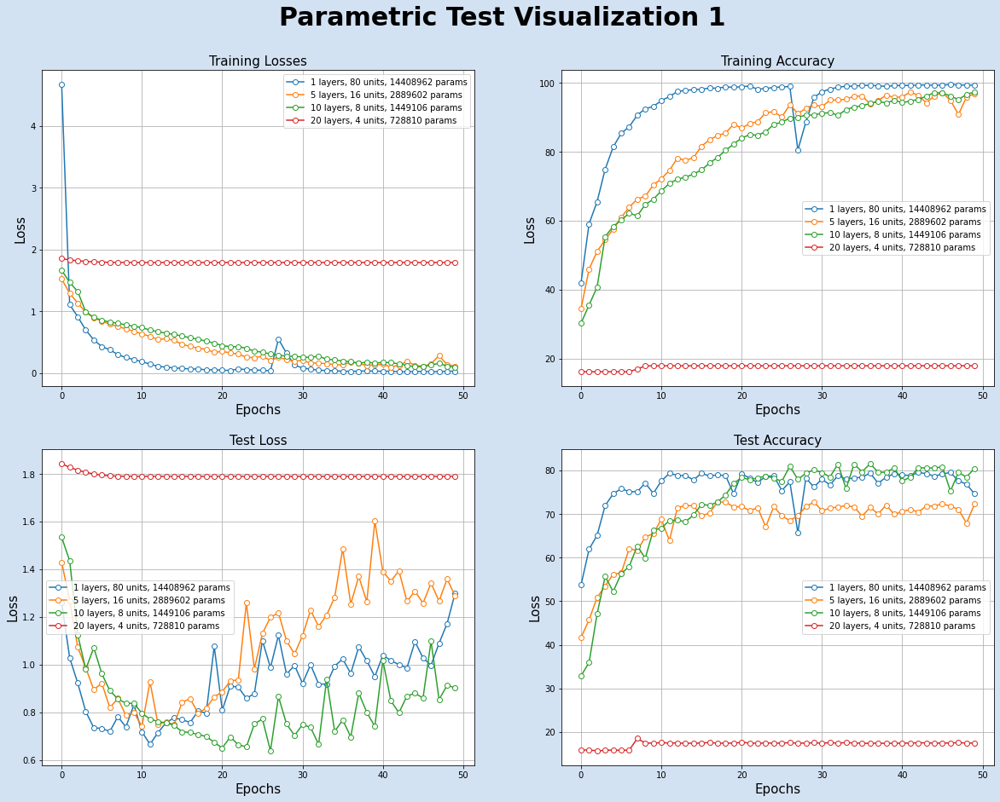

In [16]:
# Now the result time

fig, axs = plt.subplots(2, 2, figsize=(20, 15), facecolor='#D3E2F3')

model_number = 0
for index, ax in enumerate(axs.flatten()):
    ax.plot(results[:, index][0], 'o-', markerfacecolor='w')
    ax.plot(results[:, index][1], 'o-', markerfacecolor='w')
    ax.plot(results[:, index][2], 'o-', markerfacecolor='w')
    ax.plot(results[:, index][3], 'o-', markerfacecolor='w')
    ax.set_title('Training Losses', fontsize=15)
    ax.set_ylabel('Loss', fontsize=15)
    ax.set_xlabel('Epochs', fontsize=15)
    ax.legend(legend)
    ax.grid()
    
axs[0, 0].set_title('Training Losses', fontsize=15)
axs[0, 1].set_title('Training Accuracy', fontsize=15)
axs[1, 0].set_title('Test Loss', fontsize=15)
axs[1, 1].set_title('Test Accuracy', fontsize=15)

plt.suptitle("Parametric Test Visualization 1", fontweight="bold", fontsize=30, x = 0.5, y = 0.95)
plt.savefig("parametric_test_visualization1.png")
plt.show()

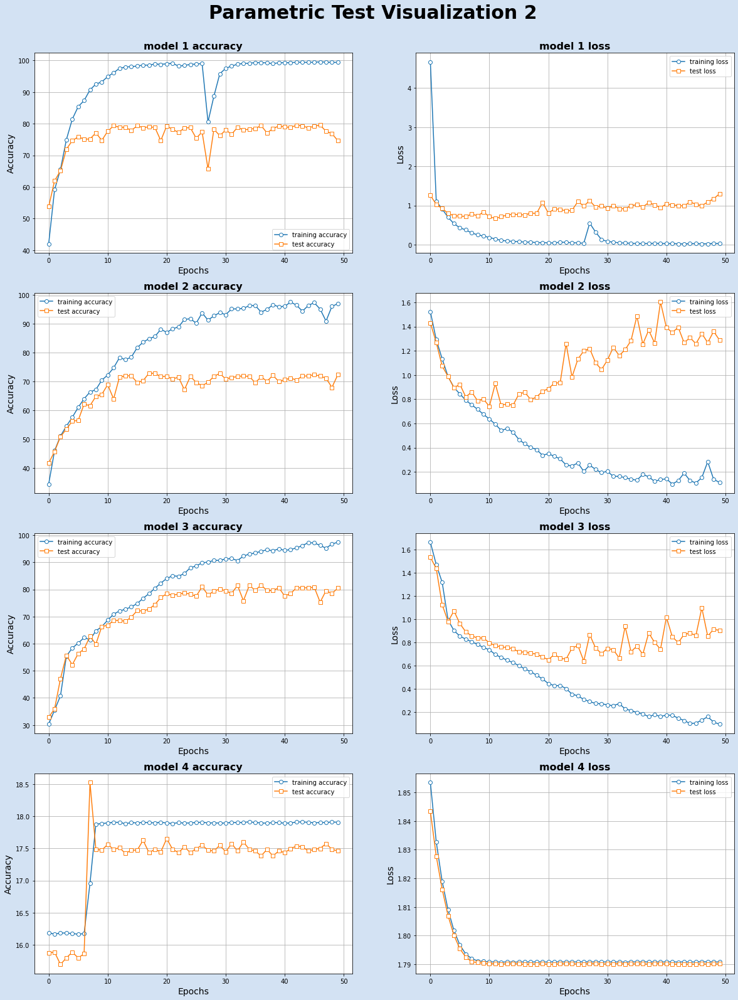

In [17]:
fig, axs = plt.subplots(4, 2, figsize = (20, 27), facecolor='#D3E2F3')

# training loss, training accuracy, test loss, test accuracy
model_number = 0
for index, ax in enumerate(axs.flatten()):
    if index % 2:
        ax.plot(results[:, 0][model_number], "o-", markerfacecolor = "w", label = "training loss")
        ax.plot(results[:, 2][model_number], "s-", markerfacecolor = "w", label = "test loss")
        ax.set_title(f"model {model_number + 1} loss", fontweight = "bold", fontsize = 16)
        ax.set_ylabel("Loss", fontsize = 14)
        ax.set_xlabel("Epochs", fontsize = 14)
        
    else:
        ax.plot(results[:, 1][model_number], "o-", markerfacecolor = "w", label = "training accuracy")
        ax.plot(results[:, 3][model_number], "s-", markerfacecolor = "w", label = "test accuracy")
        ax.set_title(f"model {model_number + 1} accuracy", fontweight = "bold", fontsize = 16)
        ax.set_ylabel("Accuracy", fontsize = 14)
        ax.set_xlabel("Epochs", fontsize = 14)
        
    ax.grid()
    ax.legend()
        
        
    if index % 2 != 0:
        model_number += 1

plt.suptitle("Parametric Test Visualization 2", fontweight="bold", fontsize=30, x = 0.5, y = 0.92)
plt.savefig("parametric_test_visualization2.png")
plt.show()

In [96]:
# lets see the best test accuracy of our 4 models
print(f"Model with 01 layer  and 80 units per layer accuracy: {best_models[0]['Accuracy']:.2f}")
print(f"Model with 05 layers and 16 units per layer accuracy: {best_models[1]['Accuracy']:.2f}")
print(f"Model with 10 layers and 08 units per layer accuracy: {best_models[2]['Accuracy']:.2f}")
print(f"Model with 20 layers and 04 units per layer accuracy: {best_models[3]['Accuracy']:.2f}")

Model with 01 layer  and 80 units per layer accuracy: 79.55
Model with 05 layers and 16 units per layer accuracy: 72.84
Model with 10 layers and 08 units per layer accuracy: 81.57
Model with 20 layers and 04 units per layer accuracy: 18.52


In [ ]:
# now, we got the best model from our parametric test. Save it as a file
torch.save(best_models[2]["network"], f"custom_model.pt")

In [18]:
# load the model
network = CNN_Net(nLayers = 10, nUnits = 8)
network.load_state_dict(torch.load("custom_model.pt"))
network.eval()  # switch on the evaluation mode

# if you want to load the pretrained model, then use the below code
# directory = "./" 
# torch.hub.load(directory, model = "model.pt", source = "local", pretrained=True)

CNN_Net(
  (layers): ModuleDict(
    (conv1): Conv2d(3, 12, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn1): BatchNorm2d(12, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu1): ReLU()
    (max_pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (conv2): Conv2d(12, 20, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu2): ReLU()
    (conv3): Conv2d(20, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn3): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu3): ReLU()
    (hidden0): Linear(in_features=180000, out_features=8, bias=True)
    (hidden1): Linear(in_features=8, out_features=8, bias=True)
    (hidden2): Linear(in_features=8, out_features=8, bias=True)
    (hidden3): Linear(in_features=8, out_features=8, bias=True)
    (hidden4): Linear(in_features=8, out_features=8, bias=True)
    (hidden5): Linear(in_features=8, out_features=8, bias=True)
    (hid

In [19]:
# summary of the model (10 hidden layers with 8 nodes for each layer)
summary(network.to(device), (3, 150, 150));

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 12, 150, 150]             336
       BatchNorm2d-2         [-1, 12, 150, 150]              24
              ReLU-3         [-1, 12, 150, 150]               0
         MaxPool2d-4           [-1, 12, 75, 75]               0
            Conv2d-5           [-1, 20, 75, 75]           2,180
              ReLU-6           [-1, 20, 75, 75]               0
            Conv2d-7           [-1, 32, 75, 75]           5,792
       BatchNorm2d-8           [-1, 32, 75, 75]              64
              ReLU-9           [-1, 32, 75, 75]               0
           Linear-10                    [-1, 8]       1,440,008
           Linear-11                    [-1, 8]              72
           Linear-12                    [-1, 8]              72
           Linear-13                    [-1, 8]              72
           Linear-14                   

In [20]:
### mow let's look though the convolution channels ###

# extract a bact from the test set
X, y = next(iter(test_loader))

# move the data to GPU
X = X.to(device)
y = y.to(device)

# prediction and out convolution layers
yHat, feature_maps1, feature_maps2 = network(X)
# check the shape of the two feature maps
print(feature_maps1.shape, feature_maps2.shape)

torch.Size([256, 12, 150, 150]) torch.Size([256, 20, 75, 75])


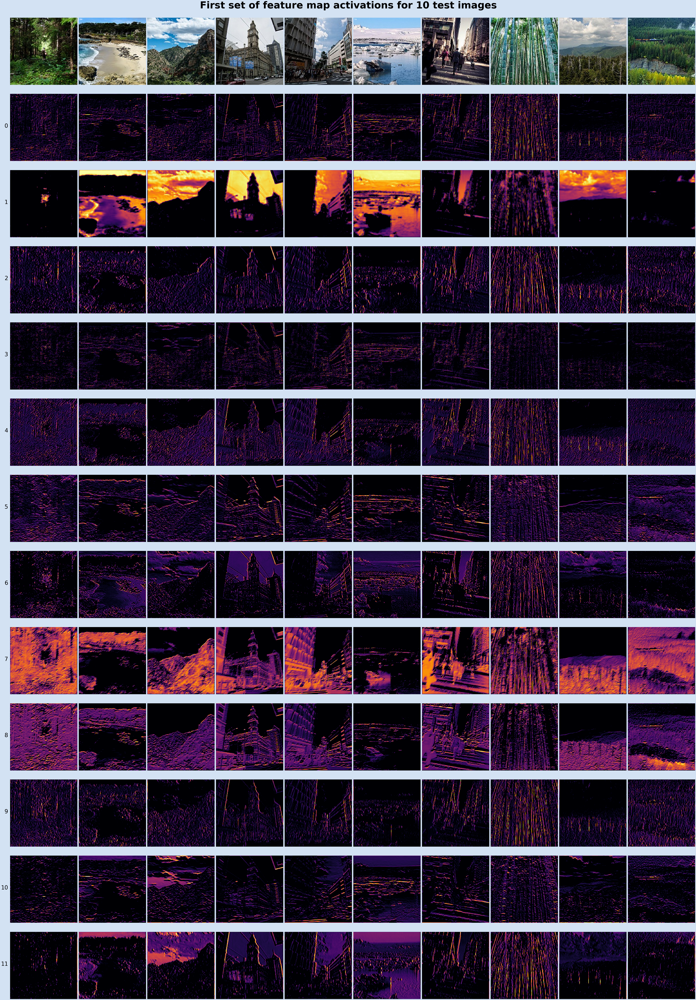

In [23]:
# Feature maps from the convolution layer 1

number_of_images = 10

fig,axs = plt.subplots(feature_maps1.shape[1] + 1, number_of_images, figsize=(70, 100), facecolor='#D3E2F3')

for pici in range(number_of_images):
    
    # convert the image tensors to right scales
    img = X[pici, :, :, :].detach().cpu().numpy().transpose((1, 2, 0))
    img = img - np.min(img) # undo normalization
    img = img/np.max(img)
    
    # and show the original picture
    axs[0, pici].imshow(img, vmin=0, vmax=1)
    axs[0, pici].axis('off')
    axs[0, pici].text(2,2,'T:%s'%int(y[pici].item()),ha='left',va='top',color='w',fontweight='bold')
    
    # show the feature maps of the images
    for feati in range(feature_maps1.shape[1]):
        # extract the feature map from this image
        img = feature_maps1[pici,feati,:,:].detach().cpu()
        axs[feati+1,pici].imshow(img, cmap='inferno',vmin=0,vmax=torch.max(img)*.9)
        axs[feati+1,pici].axis('off')
        axs[feati+1,pici].text(-5,feature_maps1.shape[2]/2,feati, ha='right', fontsize=40) if pici==0 else None

plt.tight_layout()
plt.suptitle(f'First set of feature map activations for {number_of_images} test images',x=.5,y=1.01, fontsize=70, fontweight="bold")

# save the plot
plt.savefig('feature_maps1.png', dpi="figure", bbox_inches='tight')
plt.show()

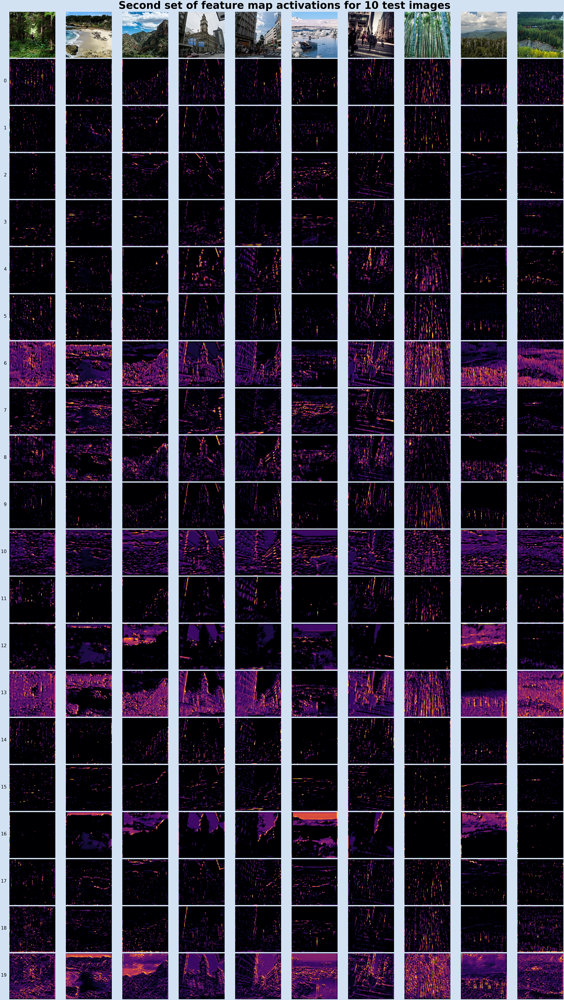

In [24]:
# Feature maps from the convolution layer 2

number_of_images = 10

fig,axs = plt.subplots(feature_maps2.shape[1] + 1, number_of_images, figsize=(70, 120), facecolor='#D3E2F3')

for pici in range(number_of_images):
    
    # convert the image tensors to right scales
    img = X[pici, :, :, :].detach().cpu().numpy().transpose((1, 2, 0))
    img = img - np.min(img) # undo normalization
    img = img/np.max(img)

    # show the original picture
    axs[0, pici].imshow(img, cmap="gray", vmin=0, vmax=1)
    axs[0, pici].axis('off')
    axs[0, pici].text(2,2,'T:%s'%int(y[pici].item()),ha='left',va='top',color='w',fontweight='bold')

    for feati in range(feature_maps2.shape[1]):
        # extract the feature map from this image
        img = feature_maps2[pici,feati,:,:].detach().cpu()
        axs[feati+1,pici].imshow(img,cmap='inferno',vmin=0,vmax=torch.max(img)*.9)
        axs[feati+1,pici].axis('off')
        axs[feati+1,pici].text(-5,feature_maps2.shape[2]/2,feati,ha='right', fontsize=40) if pici==0 else None

plt.tight_layout()
plt.suptitle(f'Second set of feature map activations for {number_of_images} test images',x=.5,y=1.01, fontsize=90, fontweight="bold")

# save the plot
plt.savefig('feature_maps2.png', dpi="figure", bbox_inches='tight')
plt.show()